# Step 1: Download the Dataset

In [1]:
import urllib.request
import os

# Create a directory to save the images
if not os.path.exists('middlebury_stereo'):
    os.makedirs('middlebury_stereo')

# Download the images
base_url = "http://vision.middlebury.edu/stereo/data/scenes2001/data"
categories = ["sawtooth", "venus", "bull", "poster", "barn1", "barn2"]

for cat in categories:
    # Create a directory to save the images
    out_dir = f"middlebury_stereo/{cat}"
    if not os.path.exists(out_dir):
        os.makedirs(out_dir)

    for i in range(9):
        filename = f"im{i}.ppm"
        urllib.request.urlretrieve(f"{base_url}/{cat}/{filename}", f"{out_dir}/{filename}")

    for disp in ["disp2.pgm", "disp6.pgm"]:
        urllib.request.urlretrieve(f"{base_url}/{cat}/{disp}", f"{out_dir}/{disp}")

# Step 2: Oversegmentation

SLIC number of segments: 256
Felzenszwalb number of segments: 330
Quickshift number of segments: 1240
Watershed number of segments: 504


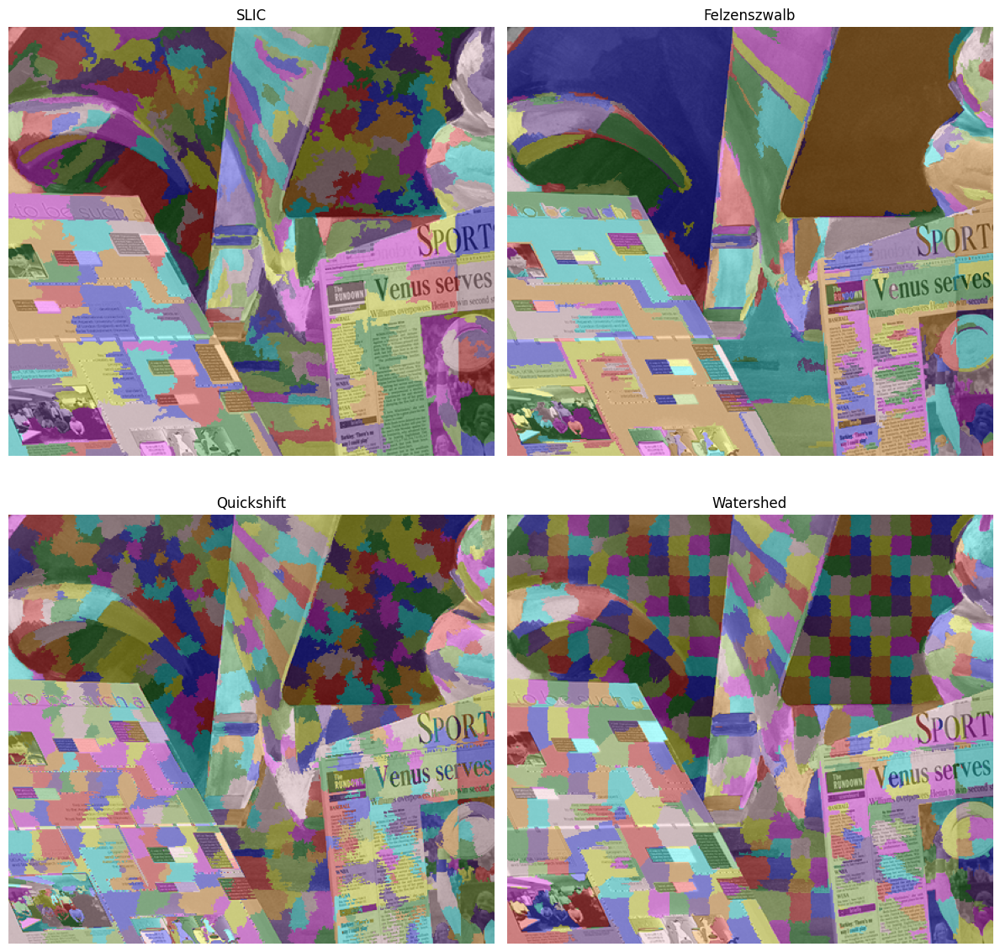

In [24]:
import cv2
import numpy as np
from skimage.segmentation import slic, felzenszwalb, quickshift, watershed
from skimage.color import rgb2gray, label2rgb
from skimage.filters import sobel
from skimage.util import img_as_float
from matplotlib import pyplot as plt

# Load left image from the Middlebury stereo dataset
image = cv2.imread('/content/middlebury_stereo/venus/im2.ppm')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Check if the image has been loaded properly
if image is None:
    print("Error loading image!")
    exit()

# Convert image to float
image = img_as_float(image)

# Apply SLIC algorithm to segment the image into superpixels
segments_slic = slic(image, n_segments=500, compactness=1, sigma=1, start_label=1)

# Apply Felzenszwalb algorithm to segment the image
segments_felzenszwalb = felzenszwalb(image, scale=100, sigma=0.5, min_size=50)

# Apply Quickshift algorithm to segment the image
segments_quickshift = quickshift(image, kernel_size=3, max_dist=6, ratio=0.5)

gradient = sobel(rgb2gray(image))
segments_watershed = watershed(gradient, markers=500, compactness=0.001)

print(f'SLIC number of segments: {len(np.unique(segments_slic))}')
print(f'Felzenszwalb number of segments: {len(np.unique(segments_felzenszwalb))}')
print(f'Quickshift number of segments: {len(np.unique(segments_quickshift))}')
print(f'Watershed number of segments: {len(np.unique(segments_watershed))}')

# Visualize the segmented images in a 2x2 grid
fig, ax = plt.subplots(2, 2, figsize=(12, 12), sharex=True, sharey=True)

ax[0, 0].imshow(label2rgb(segments_slic, image, kind='overlay'))
ax[0, 0].set_title('SLIC')

ax[0, 1].imshow(label2rgb(segments_felzenszwalb, image, kind='overlay'))
ax[0, 1].set_title('Felzenszwalb')

ax[1, 0].imshow(label2rgb(segments_quickshift, image, kind='overlay'))
ax[1, 0].set_title('Quickshift')

ax[1, 1].imshow(label2rgb(segments_watershed, image, kind='overlay'))
ax[1, 1].set_title('Watershed')

for a in ax.ravel():
    a.axis('off')

plt.tight_layout()
plt.show()

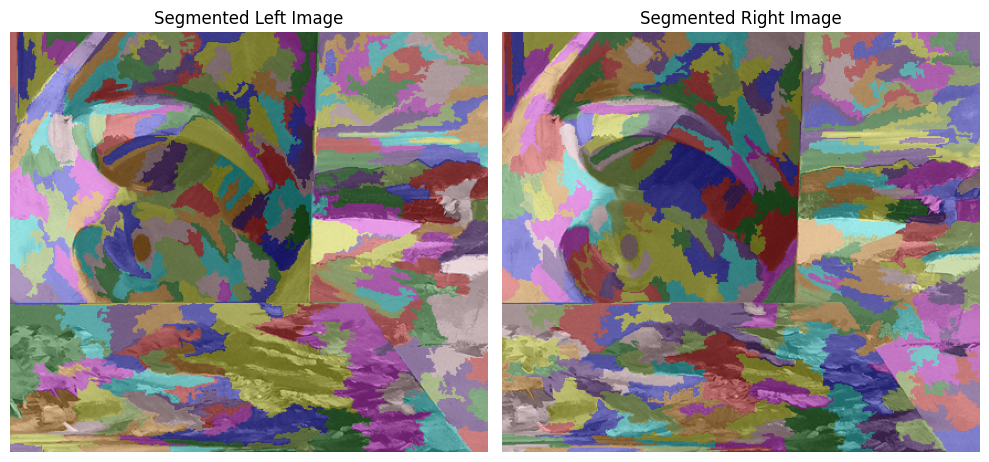

In [50]:
import cv2
import numpy as np
from skimage.segmentation import slic
from skimage.color import rgb2gray, label2rgb
from skimage.util import img_as_float
from matplotlib import pyplot as plt

# Load left and right images from the Middlebury stereo dataset
left_image = cv2.imread('/content/middlebury_stereo/bull/im2.ppm')
right_image = cv2.imread('/content/middlebury_stereo/bull/im6.ppm')
left_image = cv2.cvtColor(left_image, cv2.COLOR_BGR2RGB)
right_image = cv2.cvtColor(right_image, cv2.COLOR_BGR2RGB)

# Apply SLIC algorithm to segment the smoothed images into superpixels
n_segments = 500
compactness = 1
sigma = 1

left_segments = slic(left_image, n_segments=n_segments, compactness=compactness, sigma=sigma)
right_segments = slic(right_image, n_segments=n_segments, compactness=compactness, sigma=sigma)

# Visualize the segmented images
fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
ax[0].imshow(label2rgb(left_segments, left_image, kind='overlay'))
ax[0].set_title('Segmented Left Image')
ax[1].imshow(label2rgb(right_segments, right_image, kind='overlay'))
ax[1].set_title('Segmented Right Image')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

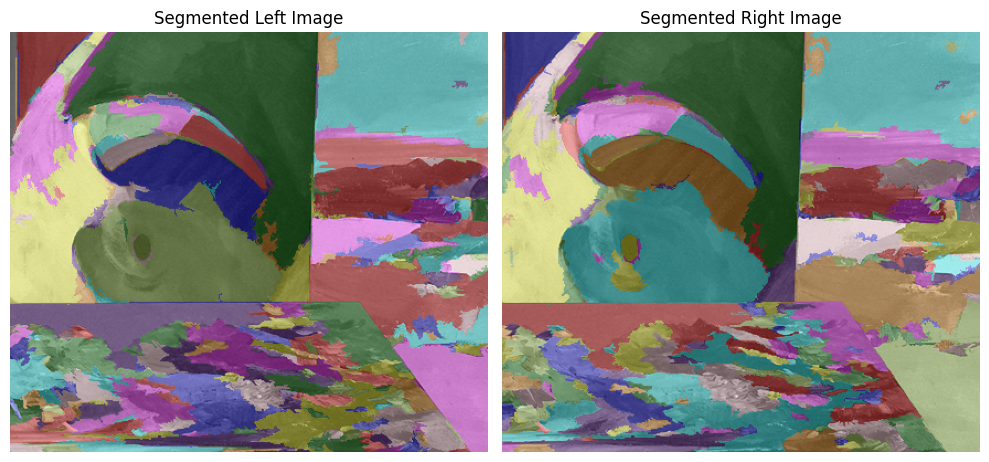

In [25]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb
from matplotlib import pyplot as plt

# Load left and right images from the Middlebury stereo dataset
left_image = cv2.imread('/content/middlebury_stereo/bull/im2.ppm')
right_image = cv2.imread('/content/middlebury_stereo/bull/im6.ppm')
left_image = cv2.cvtColor(left_image, cv2.COLOR_BGR2RGB)
right_image = cv2.cvtColor(right_image, cv2.COLOR_BGR2RGB)

# Convert images to grayscale
left_gray = cv2.cvtColor(left_image, cv2.COLOR_RGB2GRAY)
right_gray = cv2.cvtColor(right_image, cv2.COLOR_RGB2GRAY)

# Apply Felzenszwalb's Graph-Based Image Segmentation
scale = 100    # Decrease this parameter to oversegment more
sigma = 0.5   # Adjust this parameter to control the smoothness
min_size = 50 # Increase this parameter to merge smaller segments

left_segments = felzenszwalb(left_gray, scale=scale, sigma=sigma, min_size=min_size)
right_segments = felzenszwalb(right_gray, scale=scale, sigma=sigma, min_size=min_size)

# Visualize the segmented images
fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
ax[0].imshow(label2rgb(left_segments, left_image, kind='overlay'))
ax[0].set_title('Segmented Left Image')
ax[1].imshow(label2rgb(right_segments, right_image, kind='overlay'))
ax[1].set_title('Segmented Right Image')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

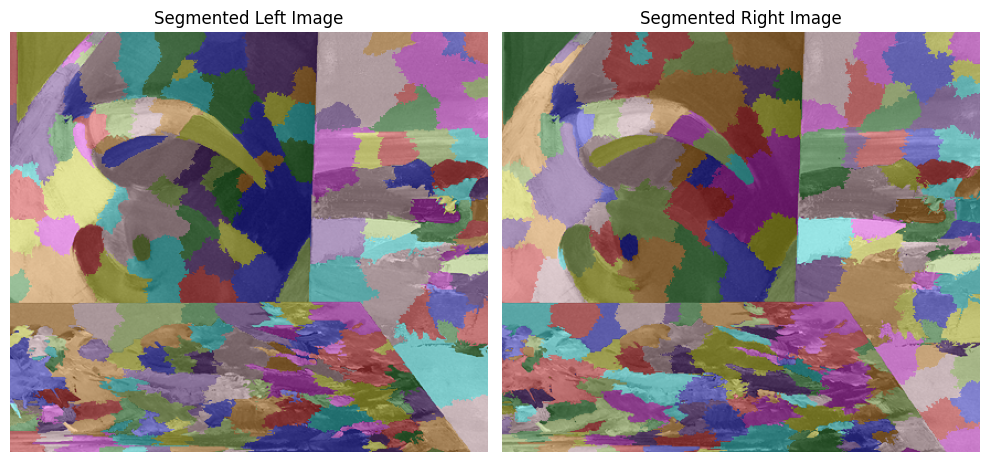

In [427]:
import cv2
import numpy as np
from skimage.segmentation import quickshift
from matplotlib import pyplot as plt

# Load left and right images from the Middlebury stereo dataset
left_image = cv2.imread('/content/middlebury_stereo/bull/im2.ppm')
right_image = cv2.imread('/content/middlebury_stereo/bull/im6.ppm')

left_image = cv2.cvtColor(left_image, cv2.COLOR_BGR2RGB)
right_image = cv2.cvtColor(right_image, cv2.COLOR_BGR2RGB)

# Apply Quickshift segmentation algorithm
ratio = 0.5  # Adjust this parameter to control the trade-off between color and space proximity
kernel_size = 5 # Adjust this parameter to control the size of the kernel
max_dist = 10 # Adjust this parameter to control the maximum distance for merging clusters

left_segments = quickshift(left_image, ratio=ratio, kernel_size=kernel_size, max_dist=max_dist)
right_segments = quickshift(right_image, ratio=ratio, kernel_size=kernel_size, max_dist=max_dist)

# Visualize the segmented images
fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
ax[0].imshow(label2rgb(left_segments, left_image, kind='overlay'))
ax[0].set_title('Segmented Left Image')
ax[1].imshow(label2rgb(right_segments, right_image, kind='overlay'))
ax[1].set_title('Segmented Right Image')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

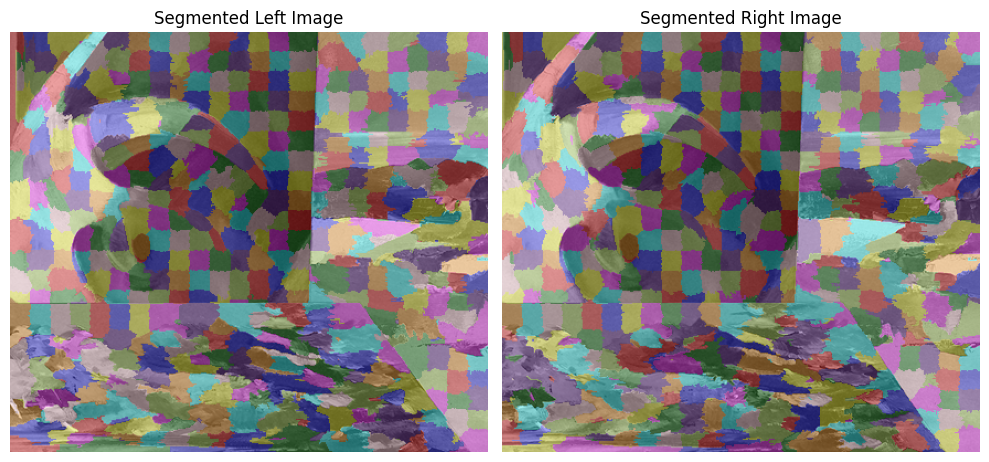

In [14]:
import cv2
import numpy as np
from skimage.segmentation import quickshift
from matplotlib import pyplot as plt

# Load left and right images from the Middlebury stereo dataset
left_image = cv2.imread('/content/middlebury_stereo/bull/im2.ppm')
right_image = cv2.imread('/content/middlebury_stereo/bull/im6.ppm')

left_image = cv2.cvtColor(left_image, cv2.COLOR_BGR2RGB)
right_image = cv2.cvtColor(right_image, cv2.COLOR_BGR2RGB)

left_gradient = sobel(rgb2gray(left_image))
right_gradient = sobel(rgb2gray(right_image))

left_segments = watershed(left_gradient, markers=500, compactness=0.001)
right_segments = watershed(right_gradient, markers=500, compactness=0.001)

# Visualize the segmented images
fig, ax = plt.subplots(1, 2, figsize=(10, 5), sharex=True, sharey=True)
ax[0].imshow(label2rgb(left_segments, left_image, kind='overlay'))
ax[0].set_title('Segmented Left Image')
ax[1].imshow(label2rgb(right_segments, right_image, kind='overlay'))
ax[1].set_title('Segmented Right Image')
for a in ax:
    a.axis('off')
plt.tight_layout()
plt.show()

In [26]:
left_segments

array([[  0,   0,   0, ...,   8,   8,   8],
       [  0,   0,   0, ...,   8,   8,   8],
       [  0,   0,   0, ...,   8,   8,   8],
       ...,
       [219, 219, 219, ..., 134, 134, 134],
       [219, 219, 219, ..., 134, 134, 134],
       [219, 219, 219, ..., 134, 134, 134]])

In [27]:
right_segments

array([[  0,   0,   1, ...,   8,   8,   8],
       [  0,   0,   1, ...,   8,   8,   8],
       [  0,   0,   1, ...,   8,   8,   8],
       ...,
       [214, 214, 214, ..., 140, 140, 140],
       [214, 214, 214, ..., 140, 140, 140],
       [214, 214, 214, ..., 140, 140, 140]])

# Step 3: Segment Matching

In [51]:
def compute_segment_histograms(image, segments):
    histograms = {}
    for segment_id in np.unique(segments):
        mask = segments == segment_id
        hist = cv2.calcHist([image], [0, 1, 2], mask.astype(np.uint8), [8, 8, 8], [0, 256, 0, 256, 0, 256])
        hist = cv2.normalize(hist, hist).flatten()
        histograms[segment_id] = hist
    return histograms

# Precompute histograms for all segments in both images
left_histograms = compute_segment_histograms(left_image, left_segments)
right_histograms = compute_segment_histograms(right_image, right_segments)

In [52]:
def match_segments(left_segments, right_segments, left_histograms, right_histograms, disparity_range=32):
    height, width = left_segments.shape

    matches = {}  # Segments matches from left to right
    scores = {}  # Scores for the best matches
    disparity_map = np.zeros(left_segments.shape)

    for row in range(height):
        prev_li = -1
        for col in range(disparity_range, width):
            li = left_segments[row, col]

            best_offset = 0
            best_score = float('inf')
            for offset in range(disparity_range):
                # Compare the corresponding segments
                ri = right_segments[row, col - offset]
                left_hist = left_histograms[li]
                right_hist = right_histograms[ri]
                score = cv2.compareHist(left_hist, right_hist, cv2.HISTCMP_BHATTACHARYYA)

                if score < best_score:
                    best_score = score
                    best_offset = offset
                    if best_score < scores.get(li, float('inf')):
                        scores[li] = score
                        matches[li] = ri

            disparity_map[row, col] = best_offset

    return matches, disparity_map

# Update the disparity map by assigning the average disparity value to each segment
def average_disparity_map(disp_map, segments):
    average_disp_map = np.zeros_like(disp_map)
    unique_segments = np.unique(segments)
    for segment_id in unique_segments:
        mask = segments == segment_id
        average_disp = np.mean(disp_map[mask])
        average_disp_map[mask] = average_disp
    return average_disp_map

# Match segments between left and right images
matches, disparity_map = match_segments(left_segments, right_segments, left_histograms, right_histograms, disparity_range=16)

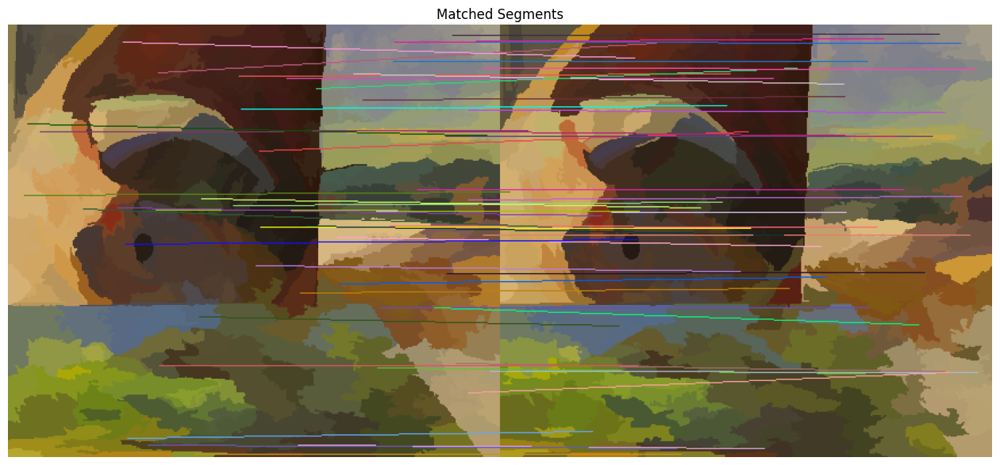

In [53]:
import random

def draw_matching_lines(left_image, right_image, matches, left_segments, right_segments, n_max_lines=None):
    # Create a combined image to draw lines
    combined_image = np.hstack((label2rgb(left_segments, left_image, kind='avg'), label2rgb(right_segments, right_image, kind='avg')))

    offset = left_image.shape[1]  # Offset for the right image

    # Generate random colors for each match
    colors = {}
    for left_segment_id in matches:
        colors[left_segment_id] = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))

    matches_list = list(matches.items())
    if n_max_lines is not None:
        random.shuffle(matches_list)
        matches_list = matches_list[:n_max_lines]

    for left_segment_id, right_segment_id in matches_list:
        left_mask = (left_segments == left_segment_id)
        right_mask = (right_segments == right_segment_id)

        left_coords = np.argwhere(left_mask)
        right_coords = np.argwhere(right_mask)

        left_centroid = np.mean(left_coords, axis=0).astype(int)
        right_centroid = np.mean(right_coords, axis=0).astype(int)

        disparity = left_centroid[1] - right_centroid[1]

        left_centroid = (left_centroid[1], left_centroid[0])  # (x, y) format
        right_centroid = (right_centroid[1] + offset, right_centroid[0])  # (x, y) format

        color = colors[left_segment_id]
        # Draw the line between centroids
        cv2.line(combined_image, left_centroid, right_centroid, color, 1)

    plt.figure(figsize=(16, 8))
    plt.imshow(combined_image)
    plt.title('Matched Segments')
    plt.axis('off')
    plt.show()

# Draw lines between matched segments with different colors
draw_matching_lines(left_image, right_image, matches, left_segments, right_segments, n_max_lines=50)

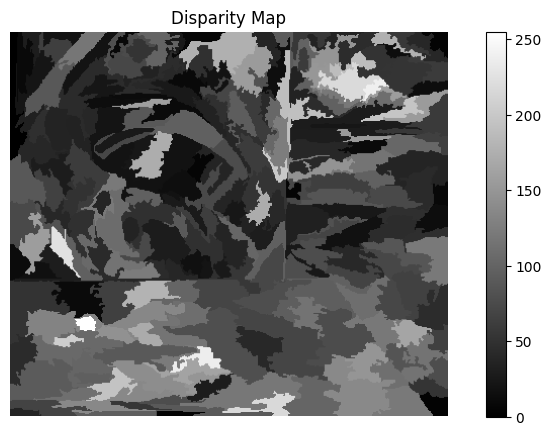

In [54]:
# Compute the updated disparity map
disparity_map = average_disparity_map(disparity_map, left_segments)

# Normalize and display disparity map
disparity_map_normalized = cv2.normalize(disparity_map, None, 0, 255, cv2.NORM_MINMAX)
disparity_map_normalized = disparity_map_normalized.astype(np.uint8)

plt.figure(figsize=(10, 5))
plt.imshow(disparity_map_normalized, cmap='gray')
plt.title('Disparity Map')
plt.colorbar()
plt.axis('off')
plt.show()

# Step 4: Tests & Results

In [48]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import slic, felzenszwalb, quickshift, watershed
from skimage.color import rgb2gray, label2rgb
from skimage.filters import sobel
from skimage.util import img_as_float

def load_stereo(category):
    dir_path = f'middlebury_stereo/{category}'

    left_image = cv2.imread(f'{dir_path}/im{2}.ppm')
    right_image = cv2.imread(f'{dir_path}/im{6}.ppm')
    disp_map = cv2.imread(f'{dir_path}/disp2.pgm', cv2.IMREAD_GRAYSCALE)

    return left_image, right_image, disp_map

def compute_error_metrics(computed_disp, ground_truth_disp):
    # Mean Absolute Error (MAE)
    mae = np.mean(np.abs(computed_disp - ground_truth_disp))
    # Root Mean Squared Error (RMSE)
    rmse = np.sqrt(np.mean((computed_disp - ground_truth_disp) ** 2))
    return mae, rmse

def test_oversegmentation(algorithm):
    categories = ["sawtooth", "venus", "bull", "poster", "barn1", "barn2"]

    for cat in categories:
        # Load the stereo images
        left_image, right_image, ground_truth_disp = load_stereo(cat)

        if algorithm == 'slic':
            left_segments = slic(left_image, n_segments=1000, compactness=10, sigma=1)
            right_segments = slic(right_image, n_segments=1000, compactness=10, sigma=1)
        elif algorithm == 'quickshift':
            left_segments = quickshift(left_image, ratio=0.5, kernel_size=5, max_dist=10)
            right_segments = quickshift(right_image, ratio=0.5, kernel_size=5, max_dist=10)
        elif algorithm == 'felzenszwalb':
            # Convert images to grayscale
            left_gray = cv2.cvtColor(left_image, cv2.COLOR_RGB2GRAY)
            right_gray = cv2.cvtColor(right_image, cv2.COLOR_RGB2GRAY)
            left_segments = felzenszwalb(left_gray, scale=100, sigma=0.5, min_size=50)
            right_segments = felzenszwalb(right_gray, scale=100, sigma=0.5, min_size=50)
        elif algorithm == 'watershed':
            left_gradient = sobel(rgb2gray(left_image))
            right_gradient = sobel(rgb2gray(right_image))
            left_segments = watershed(left_gradient, markers=500, compactness=0.001)
            right_segments = watershed(right_gradient, markers=500, compactness=0.001)

        # Calculate histograms representing segments
        left_histograms = compute_segment_histograms(left_image, left_segments)
        right_histograms = compute_segment_histograms(right_image, right_segments)

        # Match the segments
        matches, computed_disp = match_segments(left_segments, right_segments, left_histograms, right_histograms, disparity_range=16)

        # Average the disparities for the segments
        computed_disp = average_disparity_map(computed_disp, left_segments)
        computed_disp_normalized = cv2.normalize(computed_disp, None, 0, 255, cv2.NORM_MINMAX)
        computed_disp_normalized = computed_disp_normalized.astype(np.uint8)

        # Normalize the ground truth disparity map for display
        ground_truth_disp_normalized = cv2.normalize(ground_truth_disp, None, 0, 255, cv2.NORM_MINMAX)
        ground_truth_disp_normalized = ground_truth_disp_normalized.astype(np.uint8)

        # Plot the left image, computed disparity map, and ground truth disparity map side by side
        plt.figure(figsize=(20, 5))

        plt.subplot(1, 3, 1)
        plt.imshow(cv2.cvtColor(left_image, cv2.COLOR_BGR2RGB))
        plt.title('Image')
        plt.axis('off')

        plt.subplot(1, 3, 2)
        plt.imshow(ground_truth_disp_normalized, cmap='gray')
        plt.title('Ground Truth Disparity Map')
        plt.colorbar()
        plt.axis('off')

        plt.subplot(1, 3, 3)
        plt.imshow(computed_disp_normalized, cmap='gray')
        plt.title('Computed Disparity Map')
        plt.colorbar()
        plt.axis('off')

        plt.show()

        # Compute error metrics
        mae, rmse = compute_error_metrics(computed_disp, ground_truth_disp)
        print(f"Category: {cat}, MAE: {mae:.2f}, RMSE: {rmse:.2f}")

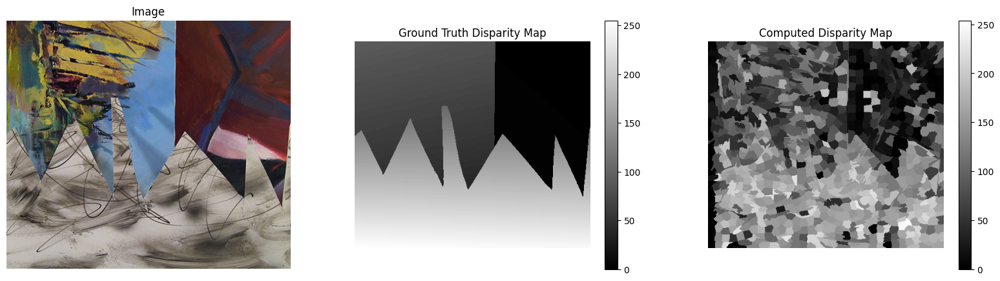

Category: sawtooth, MAE: 75.71, RMSE: 84.02


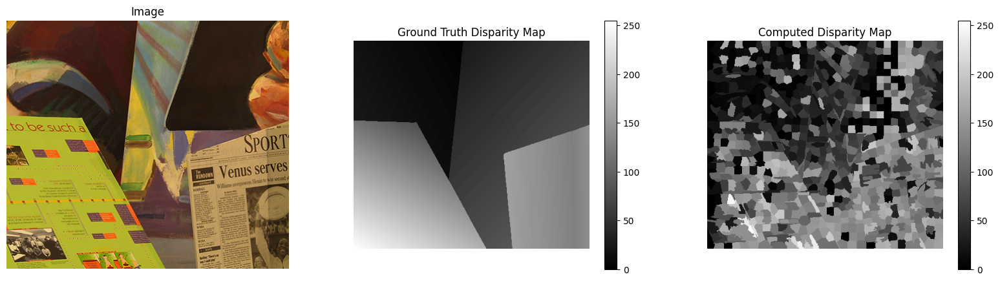

Category: venus, MAE: 67.19, RMSE: 74.25


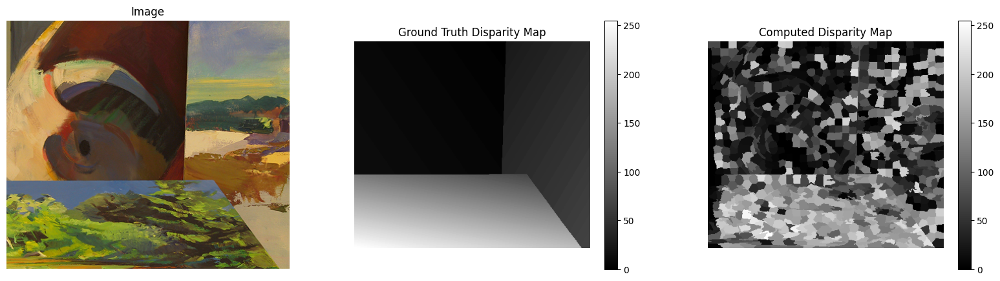

Category: bull, MAE: 56.90, RMSE: 65.58


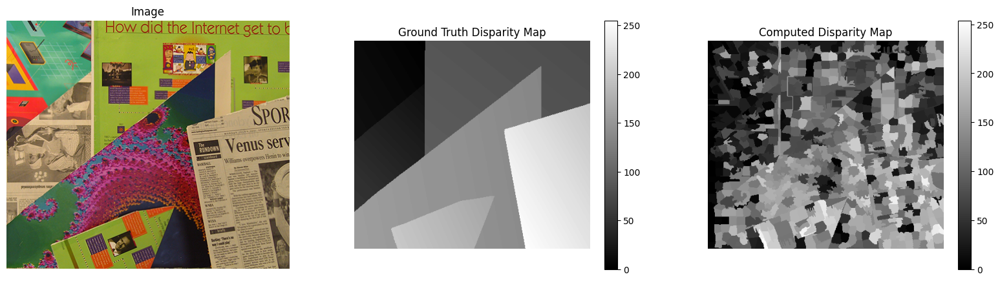

Category: poster, MAE: 88.08, RMSE: 95.46


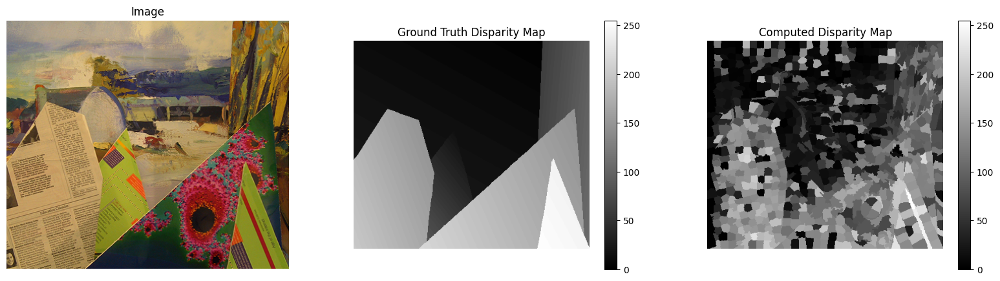

Category: barn1, MAE: 62.26, RMSE: 69.61


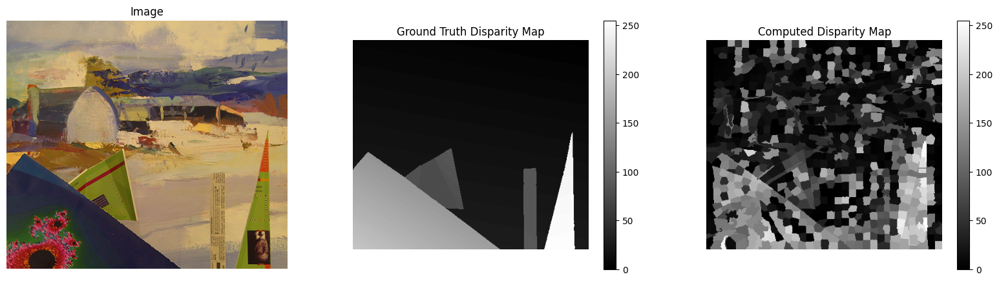

Category: barn2, MAE: 44.86, RMSE: 52.35


In [44]:
test_oversegmentation(algorithm='slic')

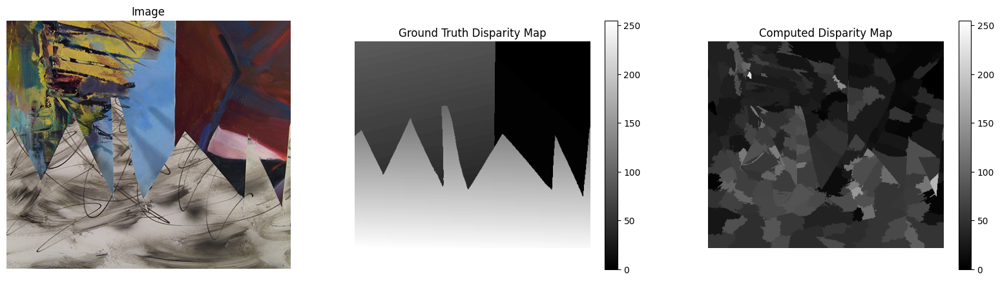

Category: sawtooth, MAE: 77.94, RMSE: 86.50


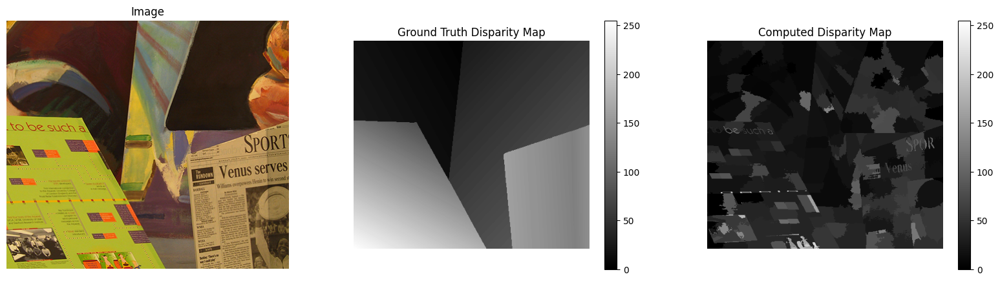

Category: venus, MAE: 69.19, RMSE: 76.31


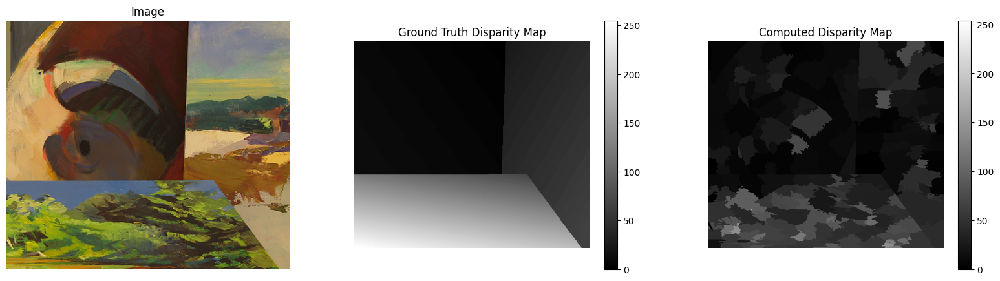

Category: bull, MAE: 58.69, RMSE: 67.33


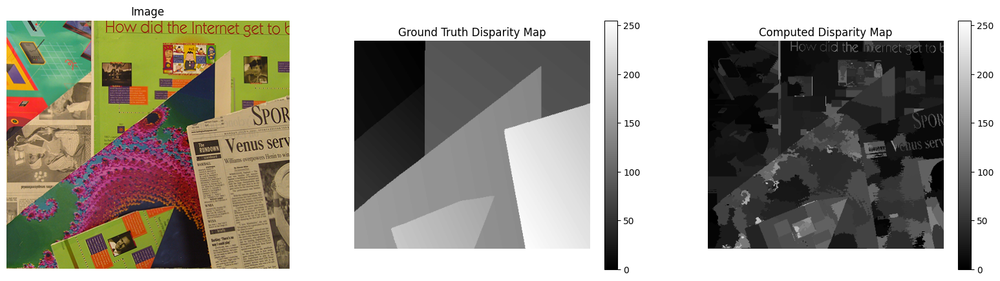

Category: poster, MAE: 90.08, RMSE: 97.53


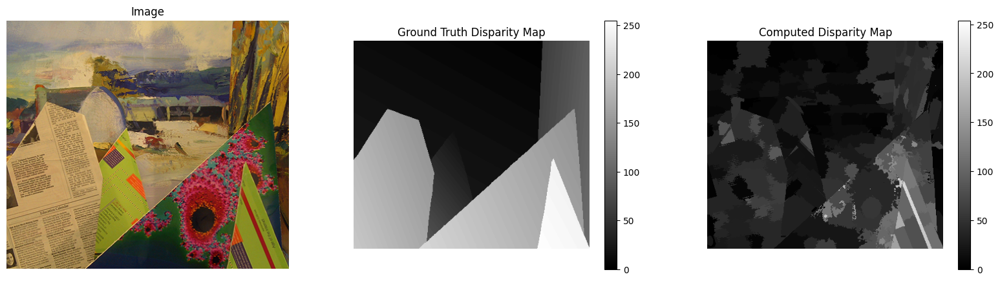

Category: barn1, MAE: 63.96, RMSE: 71.45


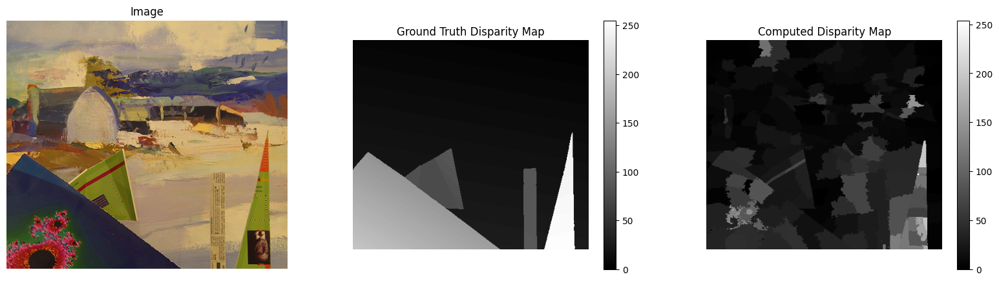

Category: barn2, MAE: 46.19, RMSE: 53.69


In [45]:
test_oversegmentation(algorithm='quickshift')

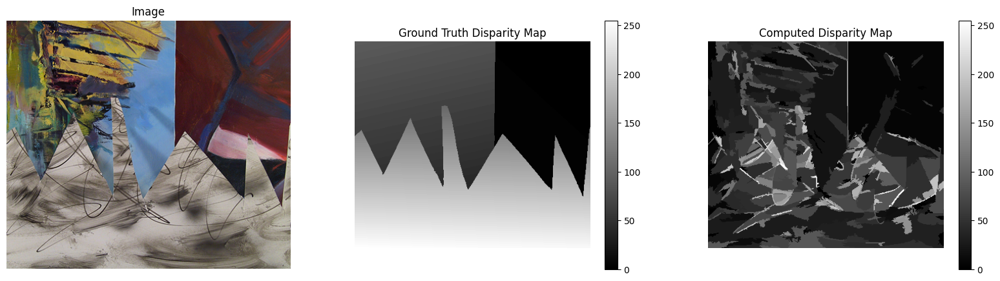

Category: sawtooth, MAE: 78.09, RMSE: 86.60


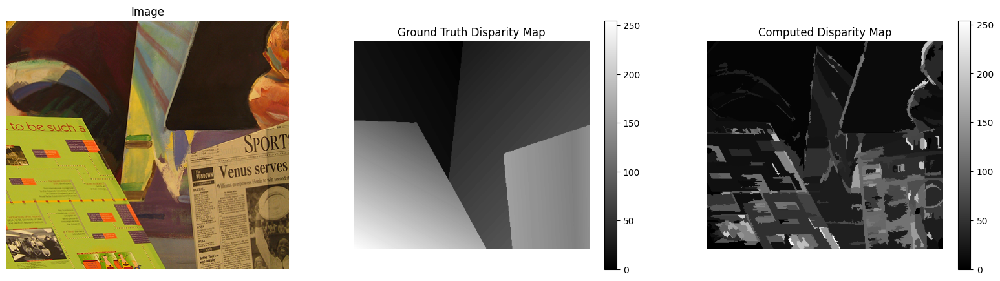

Category: venus, MAE: 69.19, RMSE: 76.14


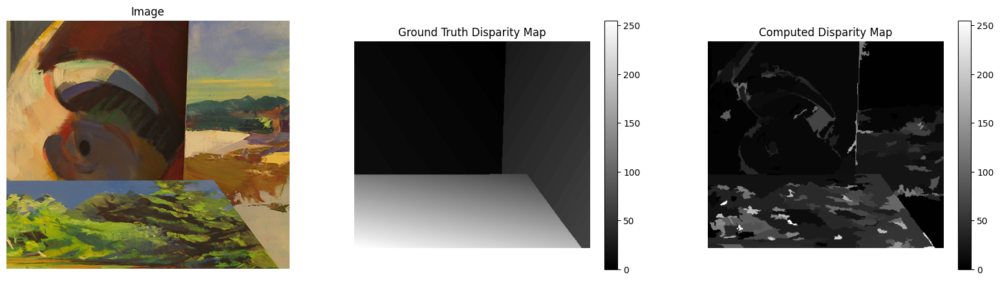

Category: bull, MAE: 59.17, RMSE: 67.87


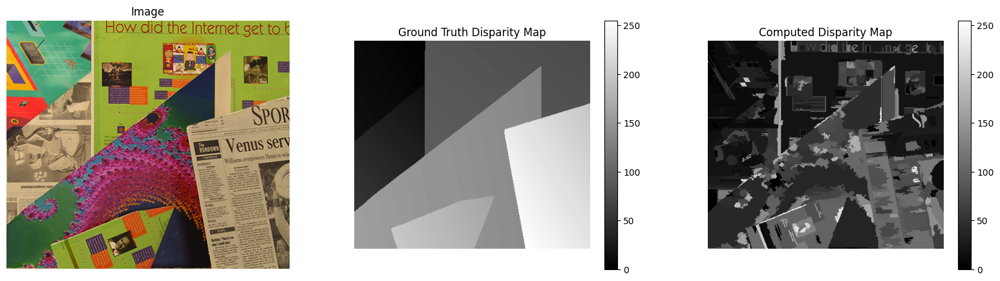

Category: poster, MAE: 89.77, RMSE: 97.14


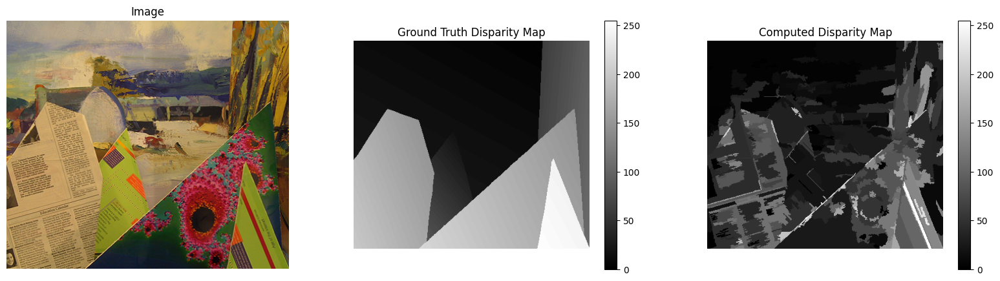

Category: barn1, MAE: 63.62, RMSE: 71.01


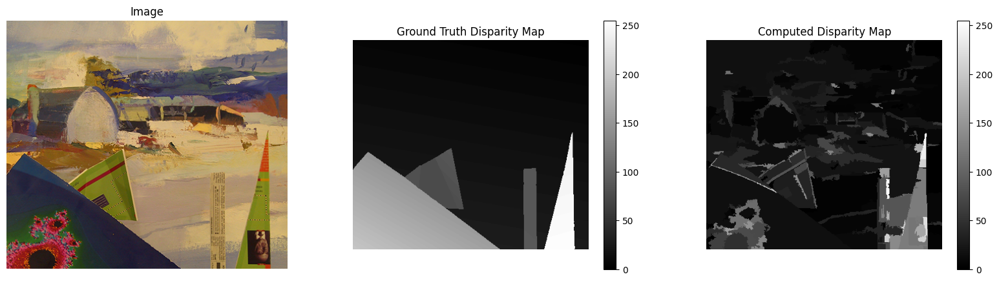

Category: barn2, MAE: 46.28, RMSE: 53.77


In [46]:
test_oversegmentation(algorithm='felzenszwalb')

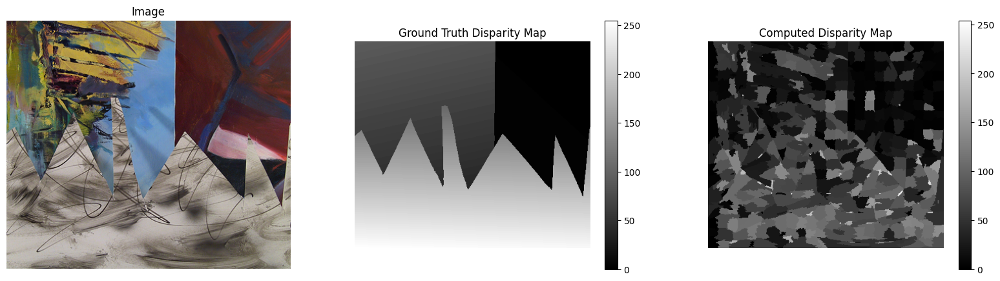

Category: sawtooth, MAE: 77.29, RMSE: 85.68


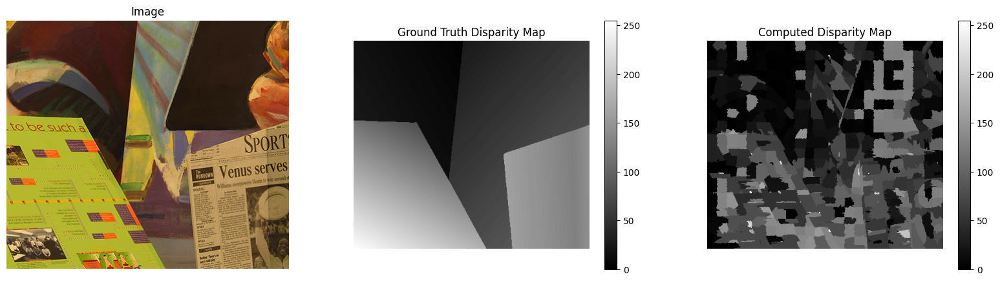

Category: venus, MAE: 68.31, RMSE: 75.41


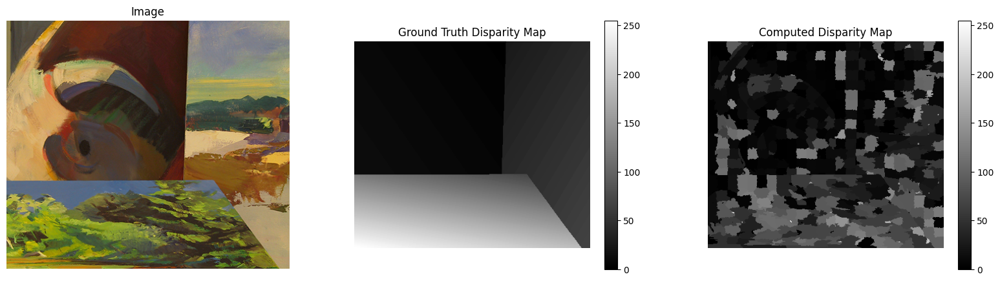

Category: bull, MAE: 58.01, RMSE: 66.79


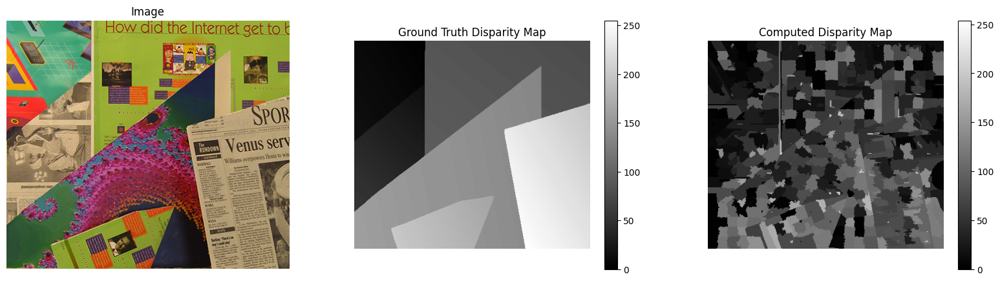

Category: poster, MAE: 89.19, RMSE: 96.67


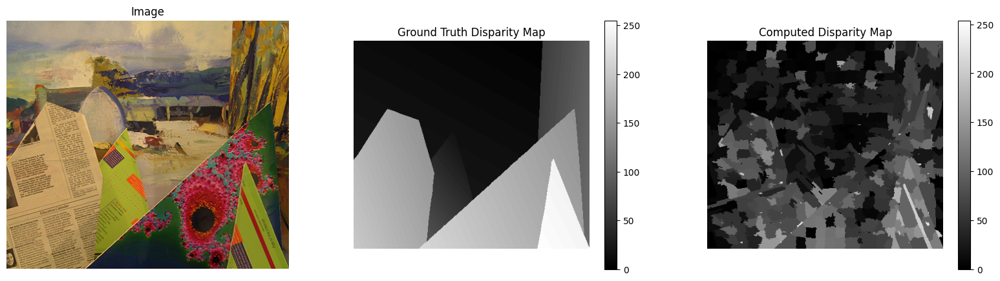

Category: barn1, MAE: 63.14, RMSE: 70.61


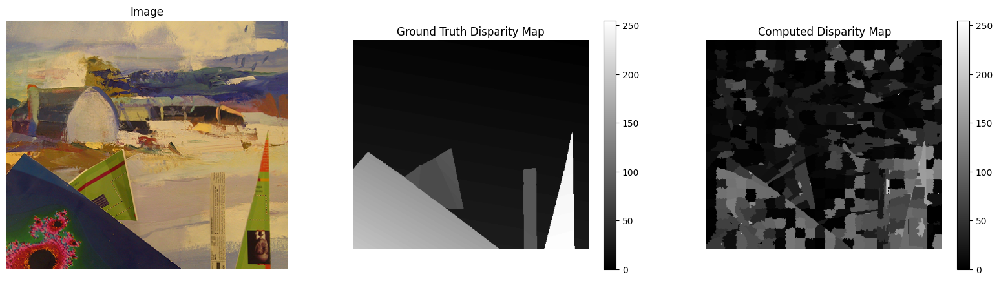

Category: barn2, MAE: 45.38, RMSE: 52.95


In [49]:
test_oversegmentation(algorithm='watershed')